GeoTIFFs encontrados:
 - openEO_2025-01-03Z.tif
 - openEO_2025-01-08Z.tif
 - openEO_2025-01-13Z.tif
 - openEO_2025-01-18Z.tif
 - openEO_2025-01-23Z.tif
 - openEO_2025-01-28Z.tif
 - openEO_2025-02-02Z.tif
 - openEO_2025-02-07Z.tif
 - openEO_2025-02-12Z.tif
 - openEO_2025-02-17Z.tif
 - openEO_2025-02-22Z.tif
 - openEO_2025-02-27Z.tif
 - openEO_2025-03-04Z.tif
 - openEO_2025-03-09Z.tif
 - openEO_2025-03-14Z.tif
 - openEO_2025-03-19Z.tif
 - openEO_2025-03-24Z.tif
 - openEO_2025-03-26Z.tif
 - openEO_2025-03-29Z.tif

Mostrando: openEO_2025-01-03Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


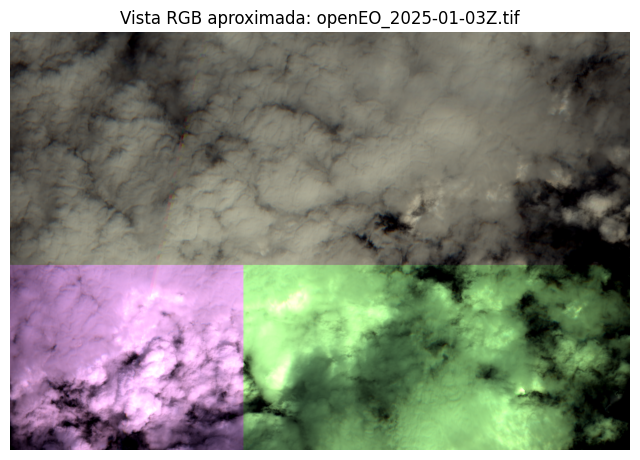


Mostrando: openEO_2025-01-08Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


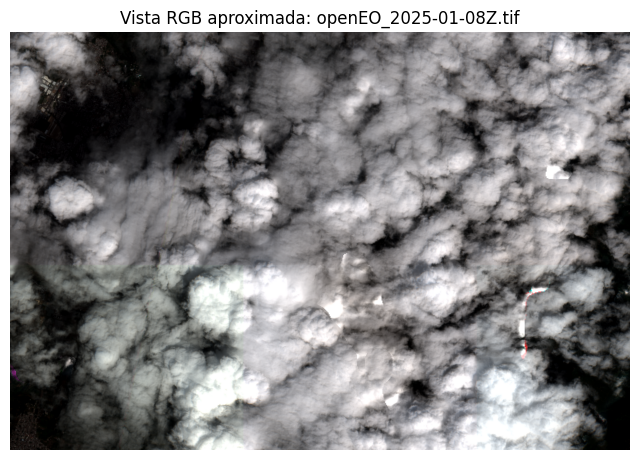


Mostrando: openEO_2025-01-13Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


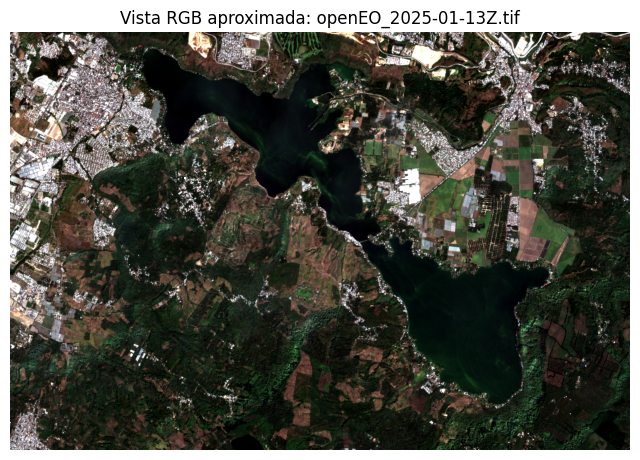


Mostrando: openEO_2025-01-18Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


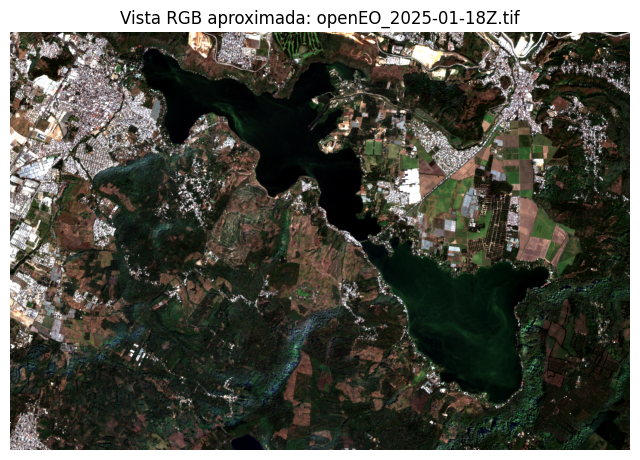


Mostrando: openEO_2025-01-23Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


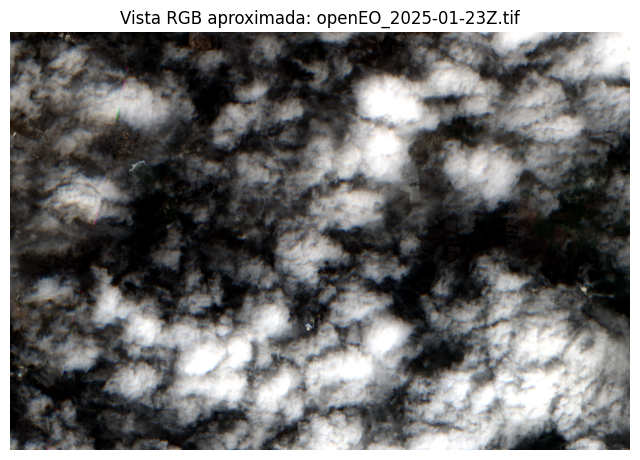


Mostrando: openEO_2025-01-28Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


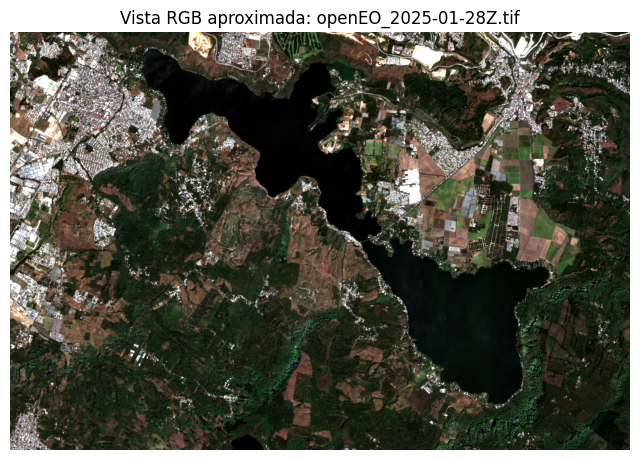


Mostrando: openEO_2025-02-02Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


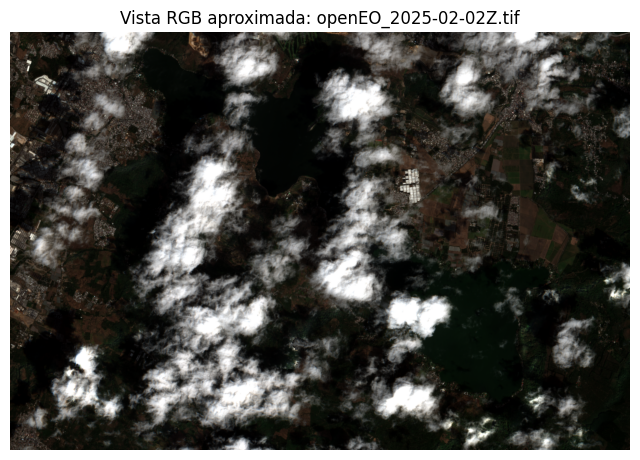


Mostrando: openEO_2025-02-07Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


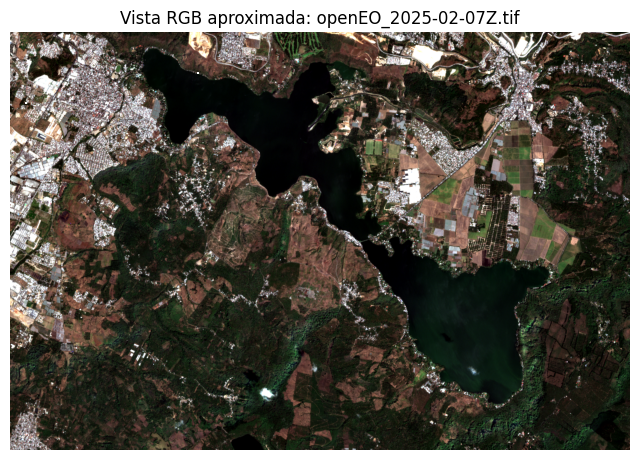


Mostrando: openEO_2025-02-12Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


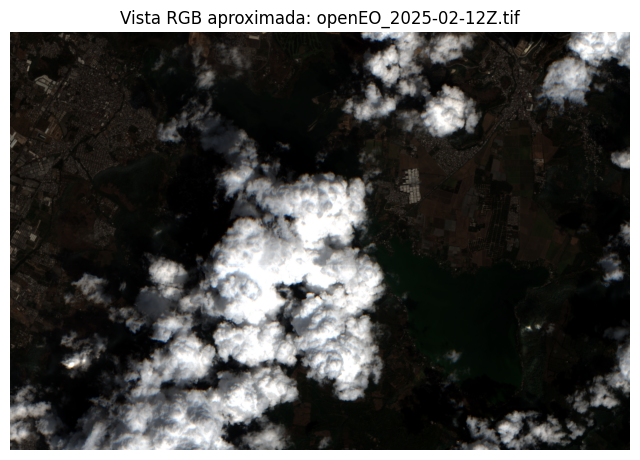


Mostrando: openEO_2025-02-17Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


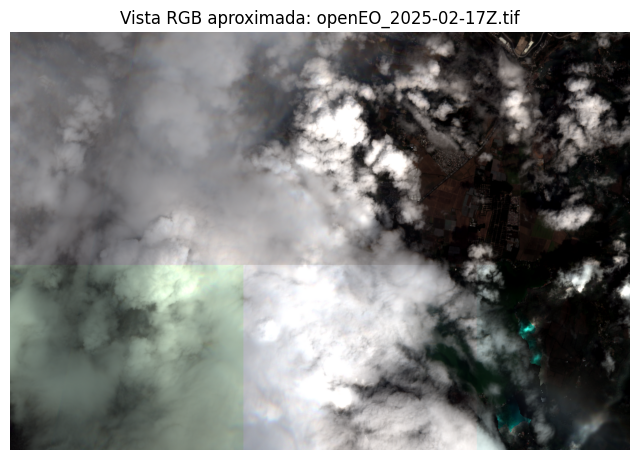


Mostrando: openEO_2025-02-22Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


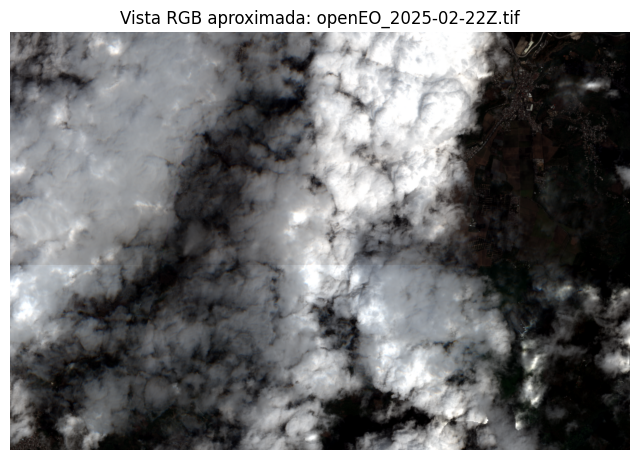


Mostrando: openEO_2025-02-27Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


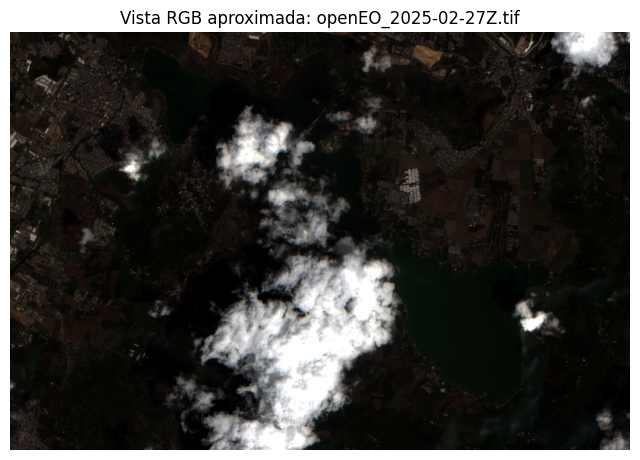


Mostrando: openEO_2025-03-04Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


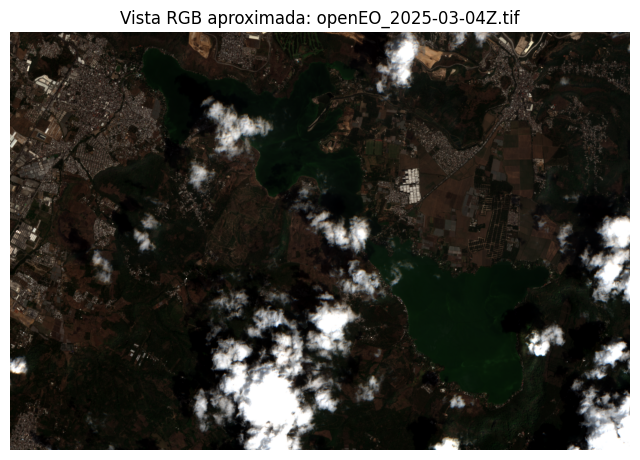


Mostrando: openEO_2025-03-09Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


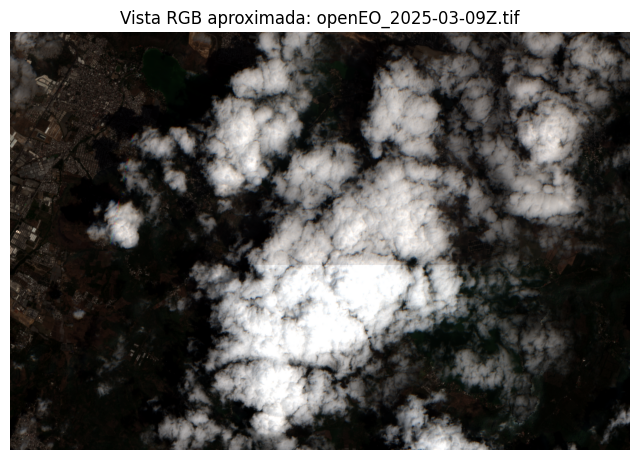


Mostrando: openEO_2025-03-14Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


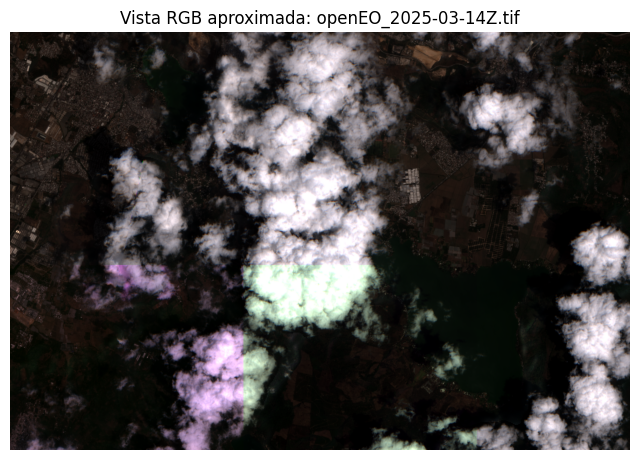


Mostrando: openEO_2025-03-19Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


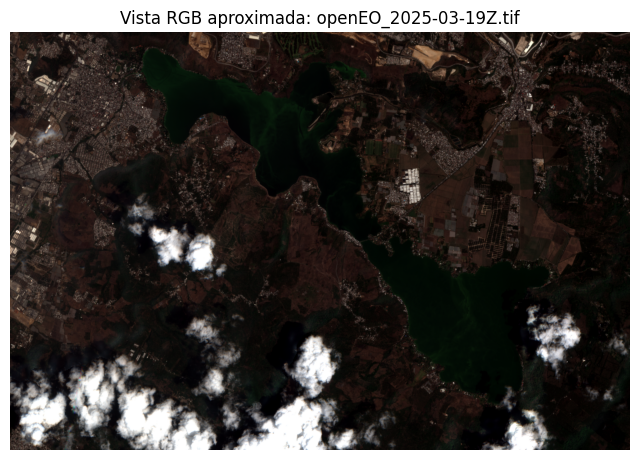


Mostrando: openEO_2025-03-24Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


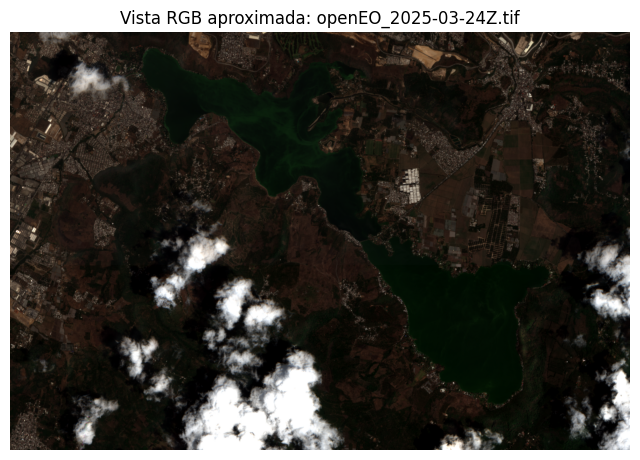


Mostrando: openEO_2025-03-26Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


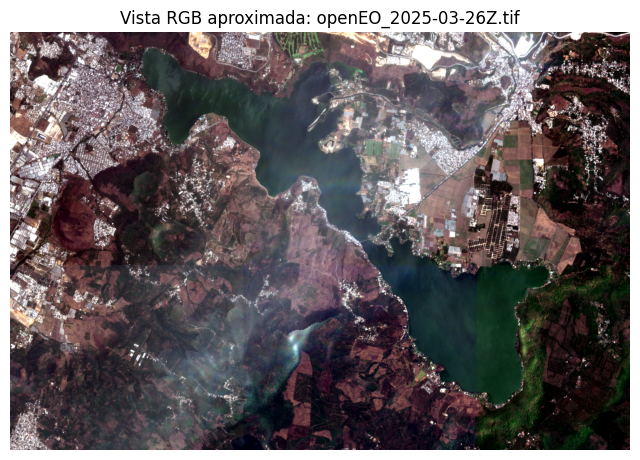


Mostrando: openEO_2025-03-29Z.tif
19 bandas; CRS: EPSG:32615 shape: (917, 1360)


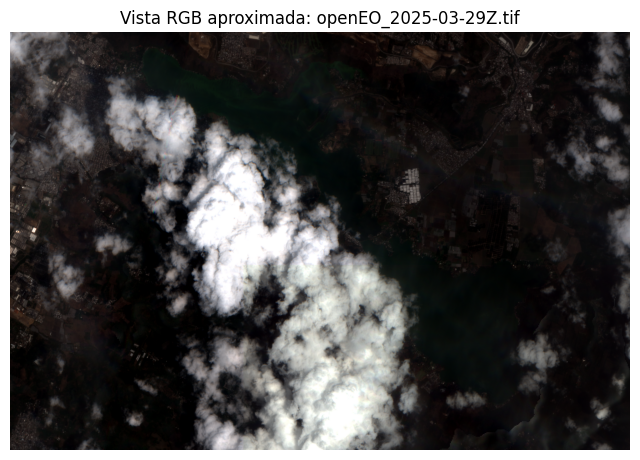

In [1]:
import re
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from pathlib import Path

base = Path("data/Amatitlan")
tifs = sorted(base.glob("*.tif"))

print("GeoTIFFs encontrados:")
for p in tifs:
    print(" -", p.name)

def find_band_idx(names, target):
    for i, n in enumerate(names, start=1):
        if not n:
            continue
        if re.search(fr"\b{target}\b", n, flags=re.IGNORECASE):
            return i
    return None

def stretch(img):
    p2, p98 = np.percentile(img[~np.isnan(img)], [2, 98])
    return np.clip((img - p2) / (p98 - p2 + 1e-6), 0, 1)

for tif_path in tifs:
    with rasterio.open(tif_path) as ds:
        print(f"\nMostrando: {tif_path.name}")
        print(ds.count, "bandas;", "CRS:", ds.crs, "shape:", (ds.height, ds.width))
        desc = ds.descriptions
        arr = ds.read()

    if arr.shape[0] >= 3:
        r_i = find_band_idx(desc, "B04") or 4
        g_i = find_band_idx(desc, "B03") or 3
        b_i = find_band_idx(desc, "B02") or 2

        rgb = np.dstack([arr[r_i-1], arr[g_i-1], arr[b_i-1]]).astype(np.float32)
        rgb = np.stack([stretch(rgb[...,0]),
                        stretch(rgb[...,1]),
                        stretch(rgb[...,2])], axis=-1)

        plt.figure(figsize=(8,8))
        plt.imshow(rgb)
        plt.title(f"Vista RGB aproximada: {tif_path.name}")
        plt.axis("off")
        plt.show()
    else:
        plt.figure(figsize=(8,6))
        plt.imshow(arr[0], vmin=np.nanpercentile(arr[0],2), vmax=np.nanpercentile(arr[0],98))
        plt.title(f"Vista banda única: {tif_path.name}")
        plt.axis("off")
        plt.show()


Se tomaron en cuenta unicamente las imagenes que no tuvieran tanta nubosisdad para poder trabajar con ellas

In [5]:
valid_images = [
"openEO_2025-01-13Z.tif",
"openEO_2025-01-18Z.tif",
"openEO_2025-01-28Z.tif",
"openEO_2025-02-07Z.tif",
"openEO_2025-03-26Z.tif"
]

Para el procesamiento de datos con ciabocterias se uso como referencia este script de la web: https://raw.githubusercontent.com/sentinel-hub/custom-scripts/master/sentinel-2/cyanobacteria_chla_ndci_l1c/script.js. Este se paso a python porque orignalmente estaba hecho para ser usado en la pagina de sentinel-2

In [ ]:
FALLBACK_IDX = {"B02":2,"B03":3,"B04":4,"B05":5,"B07":7,"B08":8,"B8A":9,"B11":11,"B12":12}

def find_idx_by_name(desc, target):
    for i, n in enumerate(desc, start=1):
        if not n:
            continue
        if re.search(fr"\b{target}\b", str(n), flags=re.IGNORECASE):
            return i
    return None

def get_band(ds, arr, desc, code):
    idx = find_idx_by_name(desc, code) or FALLBACK_IDX.get(code)
    if not idx or idx > ds.count:
        raise ValueError(f"No se encontró {code} en {ds.name}")
    return arr[idx-1].astype(np.float32)

def wbi(B04,B03,B02,B08,B11,B12):
    ndvi = (B08 - B04) / (B08 + B04 + 1e-6)
    mndwi = (B03 - B11) / (B03 + B11 + 1e-6)
    ndwi  = (B03 - B08) / (B03 + B08 + 1e-6)
    ndwi_leaves = (B08 - B11) / (B08 + B11 + 1e-6)
    aweish  = B02 + 2.5*B03 - 1.5*(B08 + B11) - 0.25*B12
    aweinsh = 4*(B03 - B11) - (0.25*B08 + 2.75*B11)
    ws = np.zeros(B04.shape, dtype=np.uint8)
    cond_water = (
        (mndwi > 0.42) |
        (ndwi  > 0.40)  |
        (aweinsh > 0.1879) |
        (aweish  > 0.1112) |
        (ndvi < -0.2) |
        (ndwi_leaves > 1)
    )
    ws[cond_water] = 1
    cond_remove = (aweinsh <= -0.03) | (((B11 - B03)/(B11 + B03 + 1e-6) - ndvi) > 0)
    ws[cond_remove] = 0
    return ws

def ndci(B04,B05):
    return (B05 - B04) / (B05 + B04 + 1e-6)

def chl_from_ndci(ndci):
    return 826.57 * ndci**3 - 176.43 * ndci**2 + 19.0 * ndci + 4.071

# --- Procesar solo las imágenes válidas ---
results = {}

for fname in valid_images:
    tif_path = base / fname
    with rasterio.open(tif_path) as ds:
        arr = ds.read()
        desc = ds.descriptions or ([""]*ds.count)
        # extraer bandas
        B02 = get_band(ds, arr, desc, "B02")
        B03 = get_band(ds, arr, desc, "B03")
        B04 = get_band(ds, arr, desc, "B04")
        B05 = get_band(ds, arr, desc, "B05")
        B07 = get_band(ds, arr, desc, "B07")
        B08 = get_band(ds, arr, desc, "B08")
        B8A = get_band(ds, arr, desc, "B8A")
        B11 = get_band(ds, arr, desc, "B11")
        B12 = get_band(ds, arr, desc, "B12")

    water_mask = wbi(B04,B03,B02,B08,B11,B12)
    ndci_arr = ndci(B04,B05)
    chl_arr = chl_from_ndci(ndci_arr)

    results[fname] = {
        "ndci": ndci_arr,
        "chl": chl_arr,
        "water_mask": water_mask
    }

In [4]:
# --- Ejemplo: imprimir estadísticas ---
for name, data in results.items():
    chl_water = data["chl"][data["water_mask"]==1]
    chl_mean = np.nanmean(chl_water)
    chl_max = np.nanmax(chl_water)
    print(f"{name}: chl-a media={chl_mean:.2f} mg/m³, máx={chl_max:.2f} mg/m³")

openEO_2025-01-13Z.tif: chl-a media=18.97 mg/m³, máx=166.03 mg/m³
openEO_2025-01-18Z.tif: chl-a media=19.14 mg/m³, máx=144.16 mg/m³
openEO_2025-01-28Z.tif: chl-a media=12.28 mg/m³, máx=10849.11 mg/m³
openEO_2025-02-07Z.tif: chl-a media=-311.84 mg/m³, máx=5948.91 mg/m³
openEO_2025-03-26Z.tif: chl-a media=12.04 mg/m³, máx=76.25 mg/m³


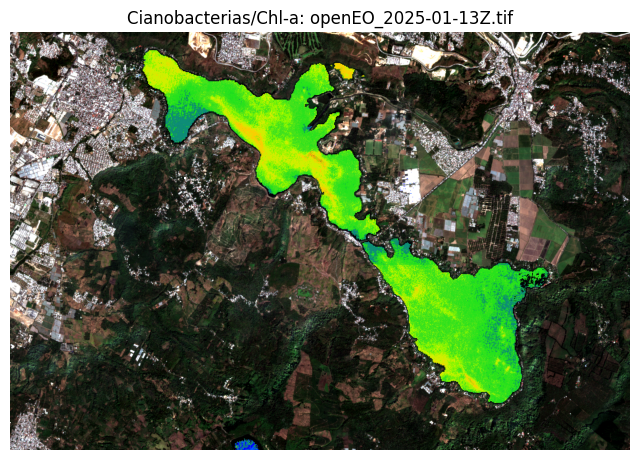

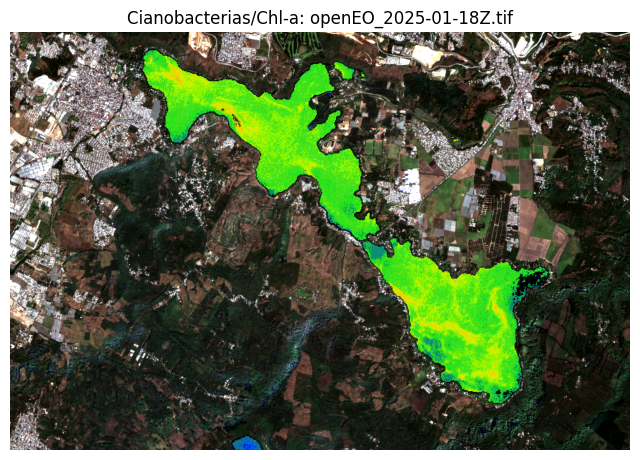

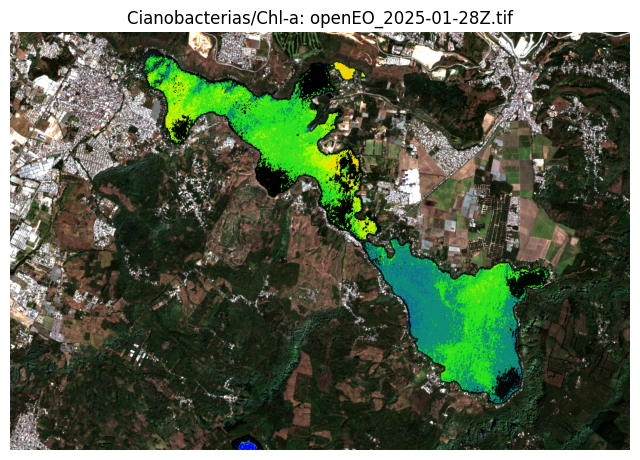

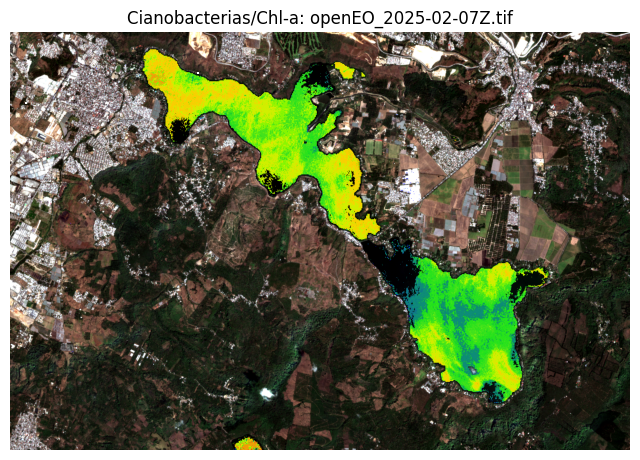

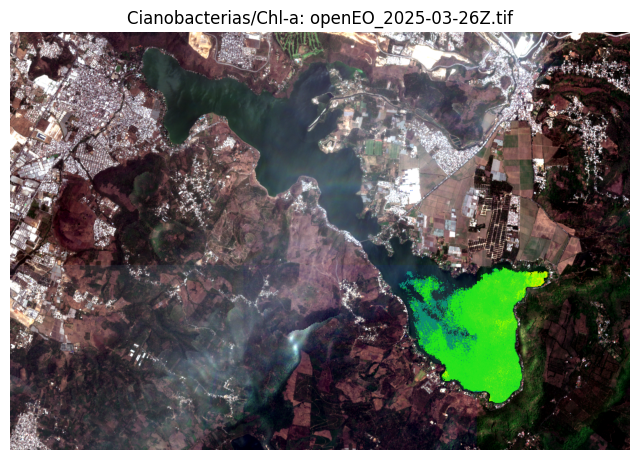

In [7]:
chl_breaks = np.array([0.5,1,2.5,3.5,5,7,8,10,14,18,20,24,28,30,38,45,50,75,90,100,150,250,300,350,450,500])
chl_colors = np.array([
    [0,0,1.0],[0,0,1.0],[0,59/255,1],[0,98/255,1],
    [15/255,113/255,141/255],[14/255,141/255,120/255],[13/255,141/255,103/255],
    [30/255,226/255,28/255],[42/255,226/255,28/255],[68/255,226/255,28/255],
    [68/255,226/255,28/255],[134/255,247/255,0],[140/255,247/255,0],[205/255,237/255,0],
    [208/255,240/255,0],[208/255,240/255,0],[251/255,210/255,3/255],[248/255,207/255,2/255],
    [134/255,247/255,0],[245/255,164/255,9/255],[240/255,159/255,8/255],[237/255,157/255,7/255],
    [239/255,118/255,15/255],[239/255,101/255,15/255],[239/255,100/255,14/255],[233/255,72/255,21/255]
])

for fname in valid_images:
    tif_path = base / fname
    with rasterio.open(tif_path) as ds:
        arr = ds.read()
        desc = ds.descriptions or ([""]*ds.count)
        B02 = get_band(ds, arr, desc, "B02")
        B03 = get_band(ds, arr, desc, "B03")
        B04 = get_band(ds, arr, desc, "B04")
        B05 = get_band(ds, arr, desc, "B05")
        B07 = get_band(ds, arr, desc, "B07")
        B08 = get_band(ds, arr, desc, "B08")
        B8A = get_band(ds, arr, desc, "B8A")
        B11 = get_band(ds, arr, desc, "B11")
        B12 = get_band(ds, arr, desc, "B12")

    # Cálculo
    water = wbi(B04,B03,B02,B08,B11,B12)
    ndci_arr = ndci(B04,B05)
    chl_arr = chl_from_ndci(ndci_arr)

    # True color
    rgb_tc = np.stack([stretch(B04*3), stretch(B03*3), stretch(B02*3)], axis=-1)

    # Aplicar paleta solo en agua
    rgb = rgb_tc.copy()
    wm = water==1
    chl_vals = chl_arr[wm]
    idx = np.searchsorted(chl_breaks, chl_vals, side='right')
    idx = np.clip(idx, 0, len(chl_colors)-1)
    rgb[wm] = chl_colors[idx]

    plt.figure(figsize=(8,8))
    plt.imshow(rgb)
    plt.title(f"Cianobacterias/Chl-a: {tif_path.name}")
    plt.axis("off")
    plt.show()


In [8]:
results

{'openEO_2025-01-13Z.tif': {'ndci': array([[ 0.07208388,  0.07420091,  0.46916473, ...,  0.583788  ,
           0.5255255 ,  0.50686496],
         [-0.08124298,  0.20718409,  0.40868264, ...,  0.4081774 ,
           0.22483423,  0.13290323],
         [ 0.07762557,  0.13803495,  0.3572969 , ...,  0.2731495 ,
           0.14666666,  0.08336933],
         ...,
         [ 0.08293402,  0.24335904,  0.29149976, ...,  0.26168224,
           0.3733469 ,  0.40589568],
         [ 0.0197848 ,  0.11145155,  0.01362207, ...,  0.18006992,
           0.25581396,  0.35076252],
         [ 0.06254493, -0.03392569, -0.04135941, ...,  0.30442804,
           0.37015504,  0.41675505]], dtype=float32),
  'chl': array([[  4.8334436 ,   4.847115  ,  59.5104    , ..., 119.48839   ,
           85.29686   ,  76.01017   ],
         [  0.91963315,   7.7852383 ,  38.789036  , ...,  38.64325   ,
            8.818593  ,   5.420209  ],
         [  4.8693953 ,   5.5059657 ,  26.038666  , ...,  12.942666  ,
            5